# Facial Keypoints

This facial keypoint detection uses the 

Data files

- training.csv: list of training 7049 images. Each row contains the (x,y) coordinates for up to 15 keypoints, and image data as row-ordered list of pixels.
- test.csv: list of 1783 test images. Each row contains ImageId and image data as row-ordered list of pixels


## Packages

In [1]:
import pandas as pd
import numpy as np
import sklearn
import sklearn.model_selection
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
!pip install wget
import wget
import sys
import os

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=875c49faf87f9b0feff1fb9657fb3c940c7a36ccfcbb8627473345eae7366349
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


## Datasets

Load the dataset *FacialKeypointsDetection* containing face image associated with up to 15 keypoints representing element on the faces (left_eye_center, right_eye_center, left_eye_inner_corner, left_eye_outer_corner, right_eye_inner_corner, right_eye_outer_corner, left_eyebrow_inner_end, left_eyebrow_outer_end, right_eyebrow_inner_end, right_eyebrow_outer_end, nose_tip, mouth_left_corner, mouth_right_corner, mouth_center_top_lip, mouth_center_bottom_lip)



In [2]:
def download_file(url, filename):
    def bar_progress(current, total, width=80):
      progress_msg = "Downloading: %d%% [%d / %d] bytes" % (current / total * 100, current, total)
      sys.stdout.write("\r" + progress_msg)
      sys.stdout.flush()

    if os.path.exists('_downloaded')==False:
        os.mkdir('_downloaded')
        
    filepath = os.path.join('_downloaded', filename)
    if os.path.exists(filepath)==True:
        return filepath
    
    wget.download(url, filepath, bar=bar_progress)
    return filepath

# Download trainin file
url = 'https://raw.githubusercontent.com/vincentbonnetcg/Numerical-Bric-a-Brac/master/data/datasets/FacialKeypointsDetection/training.zip'
filepath = download_file(url,  'training.zip')
# Load training file
training_df = pd.read_csv(filepath)
# Print Missing values
#print('# Missing/Null values')
#print(training_df.isnull().sum())
# Infos
print('# Raw dataframe shape : {}'.format(training_df.shape))
print('# Attributes : {}'.format(training_df.columns))


Downloading: 100% [63023793 / 63023793] bytes# Raw dataframe shape : (7049, 31)
# Attributes : Index(['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y', 'Image'],
      dtype='object')


The dataset contains missing data. We should remove the row containing missing data to make sure each image is associated to exactly 30 keypoints.

In [3]:
# Cleanup dataframe
training_df.dropna(inplace = True)
training_df.reset_index(inplace = True, drop=True)
# dataframe Infos
print('Clean dataframe shape : {}'.format(training_df.shape))
# Image attribute Infos
print('The image is of type {}'.format(type(training_df['Image'][0])))
print('The image data looks like {}...'.format(training_df['Image'][0][1:100]))

Clean dataframe shape : (2140, 31)
The image is of type <class 'str'>
The image data looks like 38 236 237 238 240 240 239 241 241 243 240 239 231 212 190 173 148 122 104 92 79 73 74 73 73 74 81 ...


## Image Visualization

Image size (96, 96)


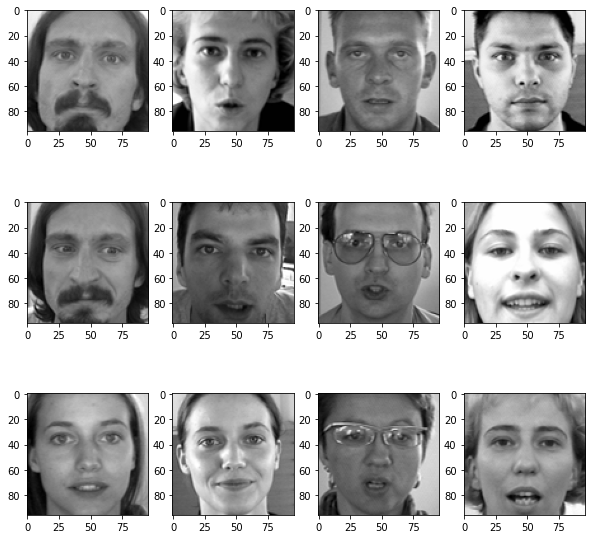

In [4]:
func = lambda x : np.fromstring(x, dtype=int, sep=' ').reshape(96, 96)
images = training_df['Image'].apply(func)
print('Image size {}'.format(images[0].shape))

fig = plt.figure(figsize=(10,10))
for image_id in range(12): # TODO 
    ax = fig.add_subplot(3,4,image_id+1)
    plt.imshow(images[image_id], cmap='gray')

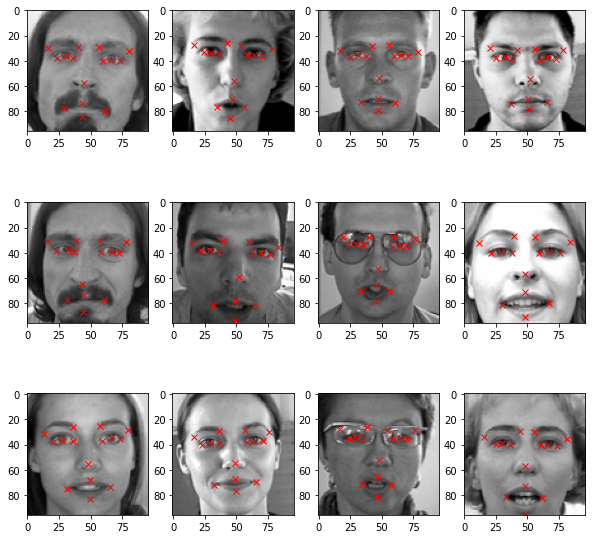

In [5]:
fig = plt.figure(figsize=(10,10))
for image_id in range(12):
    ax = fig.add_subplot(3,4,image_id+1)
    plt.imshow(images[image_id], cmap='gray')
    for j in range(0, 30, 2):
        x = training_df.loc[image_id][j]
        y = training_df.loc[image_id][j+1]
        plt.plot(x,y, 'rx')


## Data Augmentation

In [6]:
# TODO - to add variation/transformation in the dataset

## Prepare Training Data

### Prepare Input

X shape (2140, 96, 96, 1)
X values range from 0.0 to 1.0


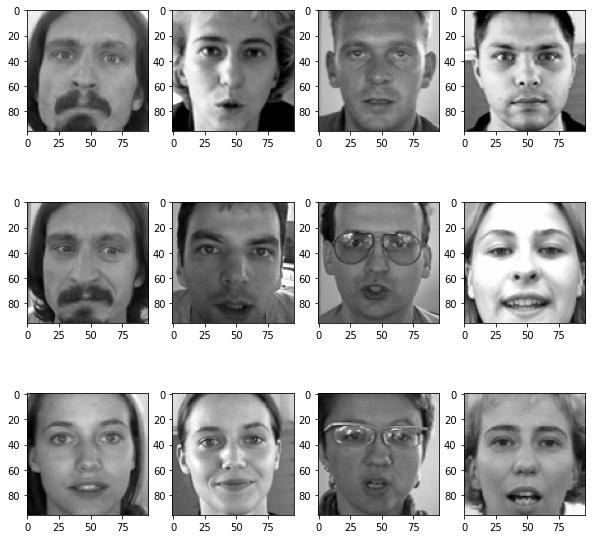

In [7]:
# Normalize the data
normalized_images = images / 255 

# Create an empty array to train to train the model
X = np.empty((len(normalized_images),96,96,1))

for i in range(len(normalized_images)):
    X[i,] = np.expand_dims(normalized_images[i], axis=2) # from (96,96) to (96,96,1)

X = np.asarray(X).astype(np.float32)
print('X shape {}'.format(X.shape))
print('X values range from {} to {}'.format(np.min(X), np.max(X)))

fig = plt.figure(figsize=(10,10))
for image_id in range(12): # TODO 
    ax = fig.add_subplot(3,4,image_id+1)
    plt.imshow(np.squeeze(X[image_id]), cmap='gray')

### Prepare Output

In [8]:
# Create a y
y = training_df.iloc[:,0:-1]
y = np.asarray(y).astype(np.float32)
print('y shape {}'.format(y.shape))
print('y values range from {} to {}'.format(np.min(y), np.max(y)))

y shape (2140, 30)
y values range from 3.8262431621551514 to 95.8089828491211


### Split data

In [9]:
# split the data
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, test_size=0.1)
print('X_train shape {}'.format(X_train.shape))
print('X_test shape {}'.format(X_test.shape))
print('y_train shape {}'.format(y_train.shape))
print('y_test shape {}'.format(y_test.shape))

X_train shape (1926, 96, 96, 1)
X_test shape (214, 96, 96, 1)
y_train shape (1926, 30)
y_test shape (214, 30)


## Build Network

In [10]:
import keras
from keras.models import Model
from keras.layers import Input, Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Activation 
from keras.layers import BatchNormalization, Add, AveragePooling2D, ZeroPadding2D, MaxPool2D
from keras.initializers import glorot_uniform
from tensorflow.keras.optimizers import Adam

In [11]:
def identity_block(X, filters, stage):
    X_cpy = X
    f1, f2, f3 = filters
    
    # Main Path
    X = Conv2D(f1, (1,1), strides=(1,1), name='res_{}_identity_a'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_{}_identity_a'.format(stage))(X)
    X = Activation('relu')(X)

    X = Conv2D(f2, (3,3), strides=(1,1), padding='same', name='res_{}_identity_b'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_{}_identity_b'.format(stage))(X)
    X = Activation('relu')(X)

    X = Conv2D(f3, (1,1), strides=(1,1), name='res_{}_identity_c'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_{}_identity_c'.format(stage))(X)

    # Combine
    X = Add()([X, X_cpy])
    X = Activation('relu')(X)

    return X


In [12]:
def res_block(X, filters, stage):
    # Convolutional block
    X_cpy = X
    f1, f2, f3 = filters
    
    # Main Path 
    X = Conv2D(f1, (1,1), strides=(1,1), name='res_{}_conv_a'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = MaxPool2D((2,2))(X)
    X = BatchNormalization(axis=3, name='bn_{}_conv_a'.format(stage))(X)
    X = Activation('relu')(X)
    
    X = Conv2D(f2, (3,3), strides=(1,1), padding='same', name='res_{}_conv_b'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_{}_conv_b'.format(stage))(X)
    X = Activation('relu')(X)
    
    X = Conv2D(f3, (1,1), strides=(1,1), name='res_{}_conv_c'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_{}_conv_c'.format(stage))(X)    
    
    # Short path
    X_cpy = Conv2D(f3, (1,1), strides=(1,1), name='res_{}_conv_copy'.format(stage), kernel_initializer=glorot_uniform(seed=0))(X_cpy)
    X_cpy = MaxPool2D((2,2))(X_cpy)
    X_cpy = BatchNormalization(axis=3, name='bn_{}_conv_copy'.format(stage))(X_cpy)

    # Combine
    X = Add()([X, X_cpy])
    X = Activation('relu')(X)
    
    return X

In [23]:
def create_model():
    input_shape = (96,96,1)
    X_input = keras.Input(input_shape)
    X = ZeroPadding2D((3,3))(X_input)

    # First stage
    X = Conv2D(64, (7,7), strides=(2,2), name ='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3,3), strides=(2,2))(X)

    # Residual blocks (stage 2 and 3)
    X = res_block(X, filters=[64,64,256], stage=2)
    X = identity_block(X, [64,64,256], stage=2)
    X = res_block(X, filters=[128,128,256], stage=3)
    X = identity_block(X, [128,128,256], stage=3)

    # Average Pooling
    X = AveragePooling2D((2,2))(X)

    # Final Layer
    X = Flatten()(X)
    X = Dense(4096, activation='relu')(X)
    X = Dropout(0.2)(X)
    X = Dense(2048, activation='relu')(X)
    X = Dropout(0.1)(X)
    X = Dense(30, activation='relu')(X)

    model = Model(inputs = X_input, outputs = X)
    return model

model = create_model()
#model.summary()
print('Model created')

Model created


## Compile and Train Network

Create the output folders TensorBoard

In [26]:
import datetime

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Create output folder for the tensorflow result 
out_log = "_output"
if os.path.exists(out_log)==False:
  os.mkdir(out_log)

tf_log = os.path.join("_output", "tf_log")
if os.path.exists(tf_log)==False:
  os.mkdir(tf_log)

tf_dir_log = os.path.join(tf_log, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
if os.path.exists(tf_dir_log)==False:
  os.mkdir(tf_dir_log)

chckpt_log = os.path.join(tf_log, "weights.hdf5")

# Tensorboard callbacks
tensorboard_callback = tf.keras.callbacks.TensorBoard(tf_dir_log, histogram_freq=1)
modelcheckpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath = chckpt_log, verbose=1, save_weights_only=True, save_best_only=True)
callbacks = [tensorboard_callback, modelcheckpoint_callback]

# Start the TensorBoard board
%tensorboard --logdir $tf_dir_log # Uncomment to start tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Now, lets compile the model and run it.

In [ ]:
LEARNING_RATE = 0.001
EPOCHS = 100

adam = Adam(learning_rate = LEARNING_RATE, beta_1=0.9, beta_2=0.999, amsgrad=False)
model.compile(loss='mean_squared_error', optimizer = adam, metrics=['accuracy'])
history = model.fit(X_train, y_train, batch_size=16, epochs=EPOCHS, validation_split=0.05, callbacks=callbacks)

## Evaluate Model

### Metrics


 Plot metrics: ['loss', 'accuracy', 'val_loss', 'val_accuracy']


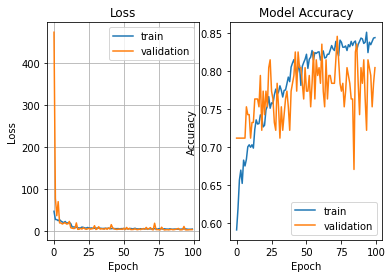

In [29]:
print('\n Plot metrics:', list(history.history.keys()))
# show history for loss
plt.subplot(1,2,1)
plt.grid(True)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'])
# show history for accuracy
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'])
plt.show()

### Evaluate

In [32]:
result = model.evaluate(X_test, y_test)
print("Test Accuracy : {}".format(result[1]))

7/7 [==============================] - 1s 119ms/step - loss: 2.9449 - accuracy: 0.7991
Test Accuracy : 0.7990654110908508


### Prediction

In [39]:
from sklearn.metrics import mean_squared_error
import math
y_test_predict = model.predict(X_test)
rmse = math.sqrt(mean_squared_error(y_test, y_test_predict))
print("Test RMSE : {}".format(rmse))

Test RMSE : 1.7160768702480143


### Display Result

In [47]:
# Convert result to dataframe
predicted_df = pd.DataFrame(y_test_predict, columns=training_df.columns[0:30])
predicted_df.head()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,left_eyebrow_outer_end_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y,nose_tip_x,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y
0,67.532516,37.762520,28.159761,36.096111,60.263645,38.393578,74.484550,39.559998,35.467804,37.204689,20.939764,36.539394,57.402279,27.581806,81.917503,30.669924,37.858852,26.653687,13.841272,27.925798,45.897652,56.608776,60.953938,76.200150,30.559792,75.398163,45.761257,70.827820,45.203766,84.854149
1,66.809914,37.816124,30.463934,34.478783,59.149307,38.642151,73.971550,39.775547,38.007427,36.501698,22.678787,34.225925,56.499775,30.302275,81.843597,34.258492,42.130093,29.190058,16.178871,28.314545,45.890579,58.730465,59.710144,79.213516,27.719812,76.716606,44.365303,75.301552,43.453335,84.403831
2,66.143845,36.785694,32.411327,37.054111,59.168846,38.053589,72.519943,37.575294,39.428043,38.218891,25.504814,37.179287,57.222305,30.875942,77.926758,30.825157,41.082165,31.485655,19.593950,32.267132,48.841805,60.635414,62.624283,78.401199,34.765575,78.959129,48.948120,77.470711,49.079433,81.866028
3,65.153381,40.698784,27.869152,32.856266,57.085899,40.535351,73.173149,43.534729,35.682331,35.878185,19.508839,31.683083,56.793530,33.959682,80.945564,38.716167,39.768509,30.676811,14.531161,24.527639,42.239647,62.046764,55.691139,76.307777,21.580118,69.569908,38.722355,75.487885,37.647194,78.025490
4,65.516876,34.572929,28.517683,36.787685,59.159920,35.859428,71.438713,35.578239,35.262676,37.430851,22.296400,37.744553,56.365654,26.668545,77.443420,27.481762,36.104538,28.668016,15.169078,31.918837,48.391350,51.488361,63.721561,72.052940,35.878319,73.896370,49.344341,66.415993,50.163204,82.468544


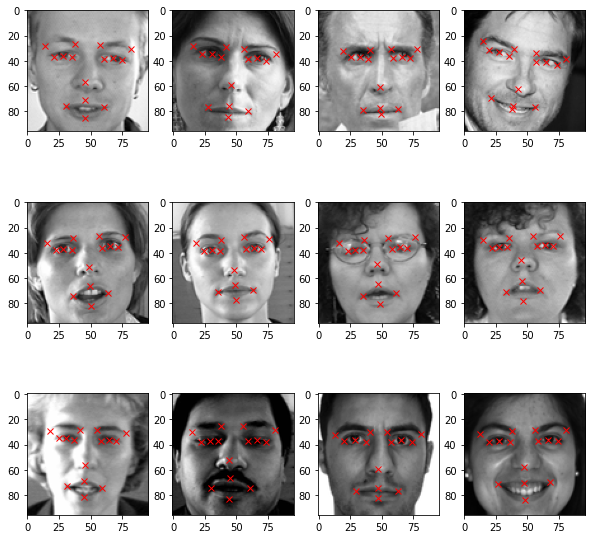

In [48]:
fig = plt.figure(figsize=(10,10))
for image_id in range(12):
    ax = fig.add_subplot(3,4,image_id+1)
    plt.imshow(X_test[image_id].squeeze(), cmap='gray')
    for j in range(0, 30, 2):
        x = predicted_df.loc[image_id][j]
        y = predicted_df.loc[image_id][j+1]
        plt.plot(x,y, 'rx')

## Resources

- Zhang, Shutong, and Chenyue Meng. "Facial keypoints detection using neural network." Stanford Report 1655 (2016): 1655. [Paper]
- https://www.kaggle.com/c/facial-keypoints-detection/data